<a href="https://colab.research.google.com/github/Nyamu007/Completed-Projects/blob/main/lidar_vectorization_tutorial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Aerial LiDAR Vectorization by Florent Poux
![Florent Poux_Vectorization.png](attachment:3e5fa841-6432-48b5-a7e0-1a18b8059e2c.png)

# Phase 1. Environment Preparation 🍇
1. Virtual Environment Setup with Python
2. Install libraries: numpy, matplotlib, pandas, open3d, laspy[lazrs,laszip], rasterio, alphashape, geopandas, shapely
3. Install IDE + Launch our Script

In [5]:
#%% 1. Aerial Lidar Vectorization: Implementation Setup

#Base libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

#3D Libraries
import open3d as o3d
import laspy
print(laspy.__version__)

#Geospatial libraries
import rasterio
import alphashape as ash
import geopandas as gpd
import shapely as sh

from rasterio.transform import from_origin
from rasterio.enums import Resampling
from rasterio.features import shapes
from shapely.geometry import Polygon


2.6.1


In [2]:
!pip install open3d

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 447.7/447.7 MB 1.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 128.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 15.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 84.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 57.2 MB/s eta 0:00:00
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.10
    Uninstalling widgetsnbextension-3.6.10:
      Successfully uninstalled widgetsnbextension-3.6.10
  Attempting uninstall: ipywidgets
    Found existing installation: ipywidgets 7.7.1
    Uninstalling ipywidgets-7.7.1:
      Successfully uninstalled ipywidgets-7.7.1


In [3]:
!pip install laspy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.1/86.1 kB 6.7 MB/s eta 0:00:00


In [4]:
!pip install alphashape

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 737.0/737.0 kB 46.2 MB/s eta 0:00:00


# Phase 2. Data Preparation 🍉
1. Aerial LiDAR Data Curation: [Vancouver Portal](https://opendata.vancouver.ca/explore/dataset/lidar-2022/map/?location=13,49.23944,-123.12768) | [.laz sample (Google Drive)](https://drive.google.com/drive/folders/1K80h_oAKbB-7cO5jNsvvG09TIBnzQy7t?usp=sharing)
2. Data Profiling
3. Data Pre-Processing

Classes in the Point Cloud
1. Unclassified
2. Bare-earth and low grass
3. Low vegetation (height <2m
4. High vegetation (height >m)
5. Water
6. Buildings
7. Others
8.
Noise (noise points, blunders, outliners, es, etc)

In [6]:
!pip install lazrs

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 649.3/649.3 kB 20.6 MB/s eta 0:00:00


In [8]:
#%% 2. Data Profiling

#neighborhood point cloud
las = laspy.read('/content/neighborhood.laz')

#single building

#explore the classification field
print(np.unique(las.classification))
print([dimension.name for dimension in las.point_format.dimensions])

#explore CRS info
crs = las.vlrs[2].string
print(las.vlrs[2].string)

LaspyException: No LazBackend selected, cannot decompress data

In [ ]:
# Look for any VLR that contains CRS or Coordinate information
crs_vlrs = [v for v in las.vlrs if "Wkt" in str(v) or "Geo" in str(v)]

if crs_vlrs:
    for i, vlr in enumerate(crs_vlrs):
        # Try to print the string representation or the description
        try:
            print(f"VLR {i} Content: {vlr.string}")
        except AttributeError:
            print(f"VLR {i} found: {vlr}")
else:
    print("No CRS-related VLRs found. The file may be in local coordinates.")

# To see ALL VLRs currently in the file:
print("\nAll VLRs found in file:", las.vlrs)

In [ ]:
import open3d as o3d
import numpy as np

# 1. Extract XYZ Coordinates
points = np.vstack((las.x, las.y, las.z)).T

# 2. Extract and Normalize Colors
# LAS 16-bit (0-65535) -> Open3D float (0.0-1.0)
colors = np.vstack((las.red, las.green, las.blue)).T
colors = colors / 65535.0

# 3. Create Open3D Point Cloud
pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(points)
pcd.colors = o3d.utility.Vector3dVector(colors)

# 4. Center the cloud (removes "jitter" from large UTM values)
pcd.translate(-pcd.get_center())

print(pcd)

In [22]:
!pip install pdal

  Using cached pdal-3.5.3.tar.gz (113 kB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  error: subprocess-exited-with-error
  
  × Building wheel for pdal (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for pdal
Failed to build pdal
ERROR: ERROR: Failed to build installable wheels for some pyproject.toml based projects (pdal)


In [10]:
!apt-get install -y liblas-bin

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
E: Unable to locate package liblas-bin


In [11]:
!las2las -i /content/neighborhood.laz -o /content/neighborhood.las

/bin/bash: line 1: las2las: command not found


In [14]:
!apt-get update
!apt-get install pdal

Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:3 https://cli.github.com/packages stable InRelease [3,917 B]
Get:4 https://cli.github.com/packages stable/main amd64 Packages [345 B]
Hit:5 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:6 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:7 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Get:10 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Hit:11 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:12 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [2,228 kB]
Get:13 https://r2u.stat.illinois.edu/ubuntu jammy/main all Packa

In [20]:
!pdal translate /content/neighborhood.laz /content/neighborhood.las

In [21]:
import pdal
import open3d as o3d
import numpy as np

def load_laz_with_pdal(file_path):
    pipeline_json = f"""
    {{
        "pipeline": [
            "{file_path}"
        ]
    }}
    """
    pipeline = pdal.Pipeline(pipeline_json)
    pipeline.execute()
    arrays = pipeline.arrays[0]

    # Extract coordinates
    points = np.vstack((arrays['X'], arrays['Y'], arrays['Z'])).T

    # Create Open3D object
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(points)

    return pcd

pcd = load_laz_with_pdal('/content/neighborhood.laz')
o3d.visualization.draw_geometries([pcd]) # Note: visualization won't work in standard Colab

ModuleNotFoundError: No module named 'pdal'

In [23]:
import open3d as o3d
import numpy as np

# 1. Extract and Center Points
# UTM coordinates are massive (millions). Subtracting the mean prevents rendering jitter.
xyz = np.vstack((las.x, las.y, las.z)).T
center = np.mean(xyz, axis=0)
centered_points = xyz - center

# 2. Extract and Normalize Colors
# LAS stores 16-bit colors (0-65535). Open3D wants 0.0-1.0.
colors = np.vstack((las.red, las.green, las.blue)).T
normalized_colors = colors / 65535.0

# 3. Create the Open3D Object
pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(centered_points)
pcd.colors = o3d.utility.Vector3dVector(normalized_colors)

print(f"Successfully created Open3D cloud with {len(pcd.points)} points.")

NameError: name 'las' is not defined

In [24]:
import laspy
import numpy as np
import open3d as o3d

# 1. Load the uncompressed file we created earlier
try:
    las = laspy.read('/content/neighborhood.las')
    print(f"File loaded! Points: {len(las.points)}")
except FileNotFoundError:
    print("Error: /content/neighborhood.las not found. Please run the PDAL translate step again.")

# 2. Extract and Center Points
# We use .scaled_x/y/z to ensure we get the actual meters/feet, not raw integers
xyz = np.vstack((las.x, las.y, las.z)).T
center = np.mean(xyz, axis=0)
centered_points = xyz - center

# 3. Extract and Normalize Colors
# LAS 16-bit (0-65535) -> Open3D float (0.0-1.0)
if hasattr(las, 'red'):
    colors = np.vstack((las.red, las.green, las.blue)).T
    normalized_colors = colors / 65535.0
else:
    # Fallback if the file has no color data
    normalized_colors = np.zeros_like(centered_points)

# 4. Create the Open3D Object
pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(centered_points)
pcd.colors = o3d.utility.Vector3dVector(normalized_colors)

print("Open3D PointCloud is ready!")
print(pcd)

File loaded! Points: 648433
Open3D PointCloud is ready!
PointCloud with 648433 points.


In [17]:
import laspy

# This should now work without the LaspyException
las = laspy.read('/content/neighborhood.laz')
print(f"Points found: {len(las.points)}")

LaspyException: No LazBackend selected, cannot decompress data

In [18]:
!pip install --upgrade laspy[lazrs]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 638.7/638.7 kB 42.3 MB/s eta 0:00:00
  Attempting uninstall: lazrs
    Found existing installation: lazrs 0.8.1
    Uninstalling lazrs-0.8.1:
      Successfully uninstalled lazrs-0.8.1


In [25]:
#%% 3. Data Pre-Processing

#%% 3.1.  Building points initialization
# Create a Mask to filter points
pts_mask = las.classification == 6

#Apply the mask and get the coordinates of the filtered dataset (note the t for transpose)
xyz_t = np.vstack((las.x[pts_mask], las.y[pts_mask], las.z[pts_mask]))

#transform to Open3D.o3d.geometry.PointCloud and visualize
pcd_o3d = o3d.geometry.PointCloud()
pcd_o3d.points = o3d.utility.Vector3dVector(xyz_t.transpose())

#translate the point cloud, and keep the translation to reapply at the end
pcd_center = pcd_o3d.get_center()
pcd_o3d.translate(-pcd_center)

#Visualize the results
o3d.visualization.draw_geometries([pcd_o3d])

[Open3D WARNING] GLFW Error: Failed to detect any supported platform
[Open3D WARNING] GLFW initialized for headless rendering.
[Open3D WARNING] GLFW Error: OSMesa: Library not found
[Open3D WARNING] Failed to create window
[Open3D WARNING] [DrawGeometries] Failed creating OpenGL window.


In [26]:
import plotly.graph_objects as go

# Extract points from your pcd_o3d object
points = np.asarray(pcd_o3d.points)

# For performance in the browser, if points > 100k, we take every 2nd point
# (Your building cloud has fewer points than the full scene, so this should be fast)
step = 1 if len(points) < 100000 else 2
vis_points = points[::step]

fig = go.Figure(data=[go.Scatter3d(
    x=vis_points[:, 0],
    y=vis_points[:, 1],
    z=vis_points[:, 2],
    mode='markers',
    marker=dict(
        size=1.5,
        color=vis_points[:, 2],   # Color by height (Z-axis)
        colorscale='Viridis',
        opacity=0.8
    )
)])

fig.update_layout(margin=dict(l=0, r=0, b=0, t=0), scene_aspectmode='data')
fig.show()

In [27]:
#%% 3.2. Isolating ground points
pts_mask = las.classification == 2
xyz_t = np.vstack((las.x[pts_mask], las.y[pts_mask], las.z[pts_mask]))

ground_pts = o3d.geometry.PointCloud()
ground_pts.points = o3d.utility.Vector3dVector(xyz_t.transpose())
ground_pts.translate(-pcd_center)

#Visualize the results
o3d.visualization.draw_geometries([ground_pts])

[Open3D WARNING] GLFW initialized for headless rendering.
[Open3D WARNING] GLFW Error: OSMesa: Library not found
[Open3D WARNING] Failed to create window
[Open3D WARNING] [DrawGeometries] Failed creating OpenGL window.


In [28]:
import plotly.graph_objects as go

# Downsample to 20,000 points max for smooth browser performance
def get_subset(pcd, max_pts=20000):
    pts = np.asarray(pcd.points)
    if len(pts) > max_pts:
        idx = np.random.choice(len(pts), max_pts, replace=False)
        return pts[idx]
    return pts

g_sub = get_subset(ground_pts)
b_sub = get_subset(pcd_o3d)

fig = go.Figure(data=[
    go.Scatter3d(x=g_sub[:,0], y=g_sub[:,1], z=g_sub[:,2],
                 mode='markers', marker=dict(size=1, color='brown'), name='Ground'),
    go.Scatter3d(x=b_sub[:,0], y=b_sub[:,1], z=b_sub[:,2],
                 mode='markers', marker=dict(size=1.5, color='blue'), name='Buildings')
])

fig.update_layout(scene_aspectmode='data', title="3D Neighborhood View")
fig.show()

In [29]:
#%% 3.2. Identifying the average distance between building points
nn_distance = np.mean(pcd_o3d.compute_nearest_neighbor_distance())
print("average point distance (m): ", nn_distance)

average point distance (m):  0.11681326921647746


# Phase 3. Single Unit Experiments 🍏
4. Unsupervised segmentation
5. 3D House Segmentation
6. 2D Building Footprint Extraction
7. Semantic and Attribute Extraction
8. 2D to 3D Vectors
9. 3D Model Creation (vertices)
10. 3D Model Creation (meshes)
11. Post-Processing and Export

In [30]:
#%% 4. Unsupervised Segmentation (Clustering) with DBSCAN
#We are now working in a local frame of reference, essential not to get stuck at truncated coordinates

#Definition of the parameters epsilon, and the minimum number of points to be considered a relevant cluster
epsilon = 2
min_cluster_points = 100

labels = np.array(pcd_o3d.cluster_dbscan(eps=epsilon, min_points=min_cluster_points))
max_label = labels.max()
print(f"point cloud has {max_label + 1} clusters")


#We use a discrete color palette to randomize the visualization
colors = plt.get_cmap("tab20")(labels / (max_label if max_label > 0 else 1))
colors[labels < 0] = 0
pcd_o3d.colors = o3d.utility.Vector3dVector(colors[:, :3])

#Point Cloud Visualization
o3d.visualization.draw_geometries([pcd_o3d])

point cloud has 31 clusters
[Open3D WARNING] GLFW initialized for headless rendering.
[Open3D WARNING] GLFW Error: OSMesa: Library not found
[Open3D WARNING] Failed to create window
[Open3D WARNING] [DrawGeometries] Failed creating OpenGL window.


In [31]:
import plotly.graph_objects as go

# 1. Prepare data for plotting
pts = np.asarray(pcd_o3d.points)
cols = np.asarray(pcd_o3d.colors)

# 2. Downsample for browser performance (1 out of every 2 points)
# This keeps the shape of the buildings while remaining interactive
vis_pts = pts[::2]
vis_cols = cols[::2]

# 3. Create the 3D Scatter Plot
fig = go.Figure(data=[go.Scatter3d(
    x=vis_pts[:, 0],
    y=vis_pts[:, 1],
    z=vis_pts[:, 2],
    mode='markers',
    marker=dict(
        size=1.5,
        color=vis_cols, # These are the tab20 colors you generated
        opacity=0.8
    )
)])

fig.update_layout(
    title=f"DBSCAN Segmentation: {max_label + 1} Clusters Detected",
    scene=dict(aspectmode='data'),
    margin=dict(l=0, r=0, b=0, t=40)
)
fig.show()

In [32]:
#%% 5. Selecting a segment to be considered
sel = 1
segment = pcd_o3d.select_by_index(np.where(labels==sel)[0])
o3d.visualization.draw_geometries([segment])

[Open3D WARNING] GLFW initialized for headless rendering.
[Open3D WARNING] GLFW Error: OSMesa: Library not found
[Open3D WARNING] Failed to create window
[Open3D WARNING] [DrawGeometries] Failed creating OpenGL window.


In [33]:
import plotly.graph_objects as go

# Extract points from the isolated segment
seg_pts = np.asarray(segment.points)

fig = go.Figure(data=[go.Scatter3d(
    x=seg_pts[:, 0],
    y=seg_pts[:, 1],
    z=seg_pts[:, 2],
    mode='markers',
    marker=dict(
        size=2,
        color=seg_pts[:, 2], # Color by height for better detail
        colorscale='Viridis',
        opacity=1.0
    )
)])

fig.update_layout(
    title=f"Detailed View: Segment #{sel}",
    scene=dict(aspectmode='data'),
    margin=dict(l=0, r=0, b=0, t=40)
)
fig.show()

In [34]:
# Calculate the Axis Aligned Bounding Box
bbox = segment.get_axis_aligned_bounding_box()
extent = bbox.get_extent() # Returns [Width, Length, Height]

print(f"--- Dimensions for Segment {sel} ---")
print(f"Width:  {extent[0]:.2f} meters")
print(f"Length: {extent[1]:.2f} meters")
print(f"Height: {extent[2]:.2f} meters")

--- Dimensions for Segment 1 ---
Width:  16.46 meters
Length: 16.51 meters
Height: 10.20 meters


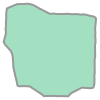

In [35]:
#%% 6. Extracting the outline (building footprint) of the selection

#We extract only the X and Y coordinates of our point cloud (Note: it is local)
points_2D = np.asarray(segment.points)[:,0:2]

#We compute the shape (alpha shape) and return the result with shapely
building_vector = ash.alphashape(points_2D, alpha=0.5)
building_vector

In [36]:
#%% Store in a Geodataframe the 2D polygon
building_gdf = gpd.GeoDataFrame(geometry=[building_vector], crs='EPSG:26910')
building_gdf.head(1)

,geometry
0,"POLYGON ((-37.796 -16.135, -37.556 -16.115, -3..."


In [37]:
#%% 7. Computing semantics and attributes

#%% 7.1. The height of the building as a relative measure

#What is wrong with this line?
altitude = np.asarray(segment.points)[:,2]+pcd_center[2]
height_test = np.max(altitude)- np.min(altitude)
print('Is this correct: ',height_test)

#We first have to define the ground level in our local area
query_point = segment.get_center()
query_point[2] = segment.get_min_bound()[2]
pcd_tree = o3d.geometry.KDTreeFlann(ground_pts)
[k, idx, _] = pcd_tree.search_knn_vector_3d(query_point, 200)

#From the nn search, we extract the points that belong to the ground and paint them grey
sample = ground_pts.select_by_index(idx, invert=False)
sample.paint_uniform_color([0.5, 0.5, 0.5])
o3d.visualization.draw_geometries([sample, ground_pts])

#Extract the mean value of the ground in this specific place
ground_zero = sample.get_center()[2]

#Compute the true height of the building, roof included:
height = segment.get_max_bound()[2] - ground_zero
print('True Height: ', height)

#Check the difference:
print('Height Difference: ', height - height_test)

Is this correct:  10.200000000000003
[Open3D WARNING] GLFW initialized for headless rendering.
[Open3D WARNING] GLFW Error: OSMesa: Library not found
[Open3D WARNING] Failed to create window
[Open3D WARNING] [DrawGeometries] Failed creating OpenGL window.
True Height:  10.074050000000007
Height Difference:  -0.125949999999996


In [38]:
import plotly.graph_objects as go

# Extract coordinates
b_pts = np.asarray(segment.points)
g_sample_pts = np.asarray(sample.points)

fig = go.Figure()

# Add the building segment
fig.add_trace(go.Scatter3d(x=b_pts[:,0], y=b_pts[:,1], z=b_pts[:,2],
                         mode='markers', marker=dict(size=1.5, color='blue'), name='Building'))

# Add the specific ground sample used for the height calculation
fig.add_trace(go.Scatter3d(x=g_sample_pts[:,0], y=g_sample_pts[:,1], z=g_sample_pts[:,2],
                         mode='markers', marker=dict(size=3, color='orange'), name='Ground Sample (KNN)'))

fig.update_layout(title=f"Height Verification (Calculated Height: {height:.2f}m)", scene_aspectmode='data')
fig.show()

In [39]:
#%%7.2. Computing parameters
building_gdf[['id']] = sel
building_gdf[['height']] = segment.get_max_bound()[2] - sample.get_center()[2]
building_gdf[['area']] = building_vector.area
building_gdf[['perimeter']] = building_vector.length
building_gdf[['local_cx','local_cy','local_cz']] = np.asarray([building_vector.centroid.x, building_vector.centroid.y, sample.get_center()[2]])
building_gdf[['transl_x','transl_y','transl_z']] = pcd_center
building_gdf[['pts_number']] = len(segment.points)

#print
building_gdf.head(1)

,geometry,id,height,area,perimeter,local_cx,local_cy,local_cz,transl_x,transl_y,transl_z,pts_number
0,"POLYGON ((-37.796 -16.135, -37.556 -16.115, -3...",1,10.07405,217.2813,58.083944,-43.395337,-22.419787,-4.426144,490276.696286,5.453749e+06,109.172094,7749


The local minima (along the Z axis) -4.552094370214576
The local maxima (along the Z axis) 5.647905629785427


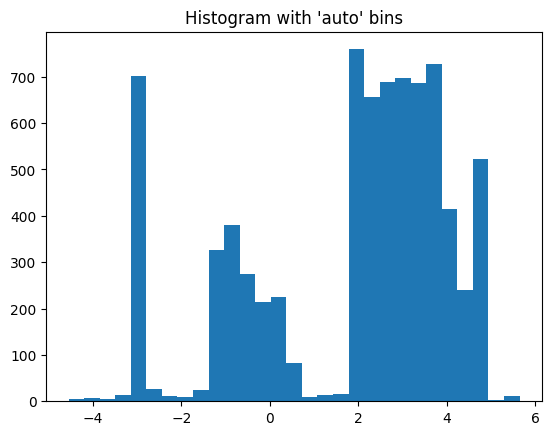

In [40]:
#%%7.3 Extra attributes
points_1D = np.asarray(segment.points)[:,2]
print('The local minima (along the Z axis)',np.min(points_1D))
print('The local maxima (along the Z axis)',np.max(points_1D))

plt.hist(points_1D, bins='auto')  # arguments are passed to np.histogram
plt.title("Histogram with 'auto' bins")
plt.show()

In [41]:
#8. 2D to 3D Library: From a shapely Vector dataset to an Open3D LineSet
#8.1. The base layer
#Generate the vertice list
vertices = list(building_vector.exterior.coords)

#Construct the Open3D Object
polygon_2d = o3d.geometry.LineSet()
polygon_2d.points = o3d.utility.Vector3dVector([point + (0,) for point in vertices])
polygon_2d.lines = o3d.utility.Vector2iVector([(i, (i + 1) % len(vertices)) for i in range(len(vertices))])

#Visualization
o3d.visualization.draw_geometries([polygon_2d])

[Open3D WARNING] GLFW initialized for headless rendering.
[Open3D WARNING] GLFW Error: OSMesa: Library not found
[Open3D WARNING] Failed to create window
[Open3D WARNING] [DrawGeometries] Failed creating OpenGL window.


In [42]:
import plotly.graph_objects as go

# 1. Extract the points from your LineSet
# Note: These points have Z=0 based on your code [point + (0,)]
line_points = np.asarray(polygon_2d.points)
line_indices = np.asarray(polygon_2d.lines)

# 2. To draw lines in Plotly, we need to provide a list of points
# separated by None to prevent them from connecting into one big scribble
x_lines, y_lines, z_lines = [], [], []

for start, end in line_indices:
    x_lines.extend([line_points[start][0], line_points[end][0], None])
    y_lines.extend([line_points[start][1], line_points[end][1], None])
    z_lines.extend([line_points[start][2], line_points[end][2], None])

# 3. Create the Plotly Figure
fig = go.Figure(data=[go.Scatter3d(
    x=x_lines, y=y_lines, z=z_lines,
    mode='lines',
    line=dict(color='red', width=5),
    name='Building Footprint'
)])

fig.update_layout(scene_aspectmode='data', title="Vector Footprint (Z=0)")
fig.show()

In [43]:
# Use the 'height' you calculated in Step 7.1
building_height = height

# Create the top ring of the building
vertices_top = [point + (building_height,) for point in vertices]

# Construct a 3D box LineSet
polygon_3d = o3d.geometry.LineSet()
all_vertices = vertices + vertices_top # Combine bottom and top rings
polygon_3d.points = o3d.utility.Vector3dVector([p + (0,) if len(p)==2 else p for p in all_vertices])

# Define lines: Bottom ring + Top ring + Vertical pillars
n = len(vertices)
lines = []
for i in range(n):
    lines.append((i, (i + 1) % n))           # Bottom ring
    lines.append((i + n, ((i + 1) % n) + n)) # Top ring
    lines.append((i, i + n))                 # Vertical pillars

polygon_3d.lines = o3d.utility.Vector2iVector(lines)
polygon_3d.paint_uniform_color([0, 1, 0]) # Green for the 3D model

print(f"LOD1 Model created with {n} vertical columns.")

LOD1 Model created with 90 vertical columns.


In [44]:
#8.2. The top layer
#Generate the same element for the Extruded
extrusion = o3d.geometry.LineSet()
extrusion.points = o3d.utility.Vector3dVector([point + (height,) for point in vertices])
extrusion.lines = o3d.utility.Vector2iVector([(i, (i + 1) % len(vertices)) for i in range(len(vertices))])
o3d.visualization.draw_geometries([polygon_2d, extrusion])

#Plot the vertices
temp = polygon_2d + extrusion
temp.points
temp_o3d = o3d.geometry.PointCloud()
temp_o3d.points = temp.points
o3d.visualization.draw_geometries([temp_o3d])

[Open3D WARNING] GLFW initialized for headless rendering.
[Open3D WARNING] GLFW Error: OSMesa: Library not found
[Open3D WARNING] Failed to create window
[Open3D WARNING] [DrawGeometries] Failed creating OpenGL window.
[Open3D WARNING] GLFW initialized for headless rendering.
[Open3D WARNING] GLFW Error: OSMesa: Library not found
[Open3D WARNING] Failed to create window
[Open3D WARNING] [DrawGeometries] Failed creating OpenGL window.


In [46]:
# Number of vertices in the footprint
n_pts = len(vertices)

# Combine the points and lines into a single LineSet
building_3d = o3d.geometry.LineSet()
building_3d.points = o3d.utility.Vector3dVector(np.asarray(polygon_2d.points).tolist() + np.asarray(extrusion.points).tolist())

# Create lines for: Bottom Ring + Top Ring + Vertical Pillars
lines = []
for i in range(n_pts):
    lines.append([i, (i + 1) % n_pts])             # Bottom loop
    lines.append([i + n_pts, (i + n_pts + 1) % (n_pts * 2) if (i + 1) % n_pts != 0 else i + n_pts - (n_pts - 1)]) # Top loop
    lines.append([i, i + n_pts])                   # Vertical pillar connection

building_3d.lines = o3d.utility.Vector2iVector(lines)
building_3d.paint_uniform_color([1, 0, 0]) # Red wireframe

LineSet with 270 lines.

In [47]:
import plotly.graph_objects as go

# 1. Get Point Cloud data
pcd_pts = np.asarray(segment.points)

# 2. Get Wireframe data
line_pts = np.asarray(building_3d.points)
line_indices = np.asarray(building_3d.lines)

x_lines, y_lines, z_lines = [], [], []
for start, end in line_indices:
    x_lines.extend([line_pts[start][0], line_pts[end][0], None])
    y_lines.extend([line_pts[start][1], line_pts[end][1], None])
    z_lines.extend([line_pts[start][2], line_pts[end][2], None])

# 3. Plot together
fig = go.Figure()

# Add LiDAR points
fig.add_trace(go.Scatter3d(x=pcd_pts[:,0], y=pcd_pts[:,1], z=pcd_pts[:,2],
                         mode='markers', marker=dict(size=1, color='blue', opacity=0.5), name='LiDAR Points'))

# Add Vector Wireframe
fig.add_trace(go.Scatter3d(x=x_lines, y=y_lines, z=z_lines,
                         mode='lines', line=dict(color='red', width=4), name='Vector Model'))

fig.update_layout(scene_aspectmode='data', title="Digital Twin: LiDAR vs. Vector Model")
fig.show()

In [48]:
#9. Generating the base vertices for the 3D Mesh with Numpy
a = np.array(building_vector.exterior.coords)
b = np.ones([a.shape[0],1])*sample.get_center()[2]
c = np.ones([a.shape[0],1])*(sample.get_center()[2] + height)

#Define the ground footprint and the height arrays of points
ground_pc = np.hstack((a, b))
up_pc = np.hstack((a, c))

#Generate an Open3D "point cloud" made of the major points
temp_o3d = o3d.geometry.PointCloud()
temp_o3d.points = o3d.utility.Vector3dVector(np.concatenate((ground_pc, up_pc), axis=0))
o3d.visualization.draw_geometries([temp_o3d])

[Open3D WARNING] GLFW initialized for headless rendering.
[Open3D WARNING] GLFW Error: OSMesa: Library not found
[Open3D WARNING] Failed to create window
[Open3D WARNING] [DrawGeometries] Failed creating OpenGL window.


In [49]:
import plotly.graph_objects as go

# Extract coordinates for visualization
g_pts = ground_pc
u_pts = up_pc

fig = go.Figure()

# Plot Ground Vertices (Black)
fig.add_trace(go.Scatter3d(x=g_pts[:,0], y=g_pts[:,1], z=g_pts[:,2],
                         mode='markers', marker=dict(size=5, color='black'), name='Ground Vertices'))

# Plot Roof Vertices (Red)
fig.add_trace(go.Scatter3d(x=u_pts[:,0], y=u_pts[:,1], z=u_pts[:,2],
                         mode='markers', marker=dict(size=5, color='red'), name='Roof Vertices'))

fig.update_layout(scene_aspectmode='data', title="Base Vertices for Mesh Generation")
fig.show()

In [50]:
import open3d as o3d
import numpy as np

# Number of vertices per ring
n = a.shape[0]

# Combine all vertices into one array for the Mesh
all_vertices = np.concatenate((ground_pc, up_pc), axis=0)

triangles = []

# Generate Wall Triangles (Two triangles per wall segment)
for i in range(n - 1):
    # Triangle 1
    triangles.append([i, i + 1, i + n])
    # Triangle 2
    triangles.append([i + 1, i + n + 1, i + n])

# Generate Roof Triangles (Simple Fan Triangulation)
# This assumes the building is relatively convex
for i in range(1, n - 1):
    triangles.append([n, n + i, n + i + 1])

# Create the Open3D Mesh Object
mesh = o3d.geometry.TriangleMesh()
mesh.vertices = o3d.utility.Vector3dVector(all_vertices)
mesh.triangles = o3d.utility.Vector3iVector(np.array(triangles))

# Compute normals so the lighting looks correct
mesh.compute_vertex_normals()
mesh.paint_uniform_color([0.6, 0.6, 0.7]) # Light grey/blue

print(f"Mesh created with {len(mesh.triangles)} triangles.")

Mesh created with 266 triangles.


In [51]:
import plotly.graph_objects as go

# Extract vertices and triangles for Plotly
verts = np.asarray(mesh.vertices)
tris = np.asarray(mesh.triangles)

fig = go.Figure(data=[
    go.Mesh3d(
        x=verts[:, 0], y=verts[:, 1], z=verts[:, 2],
        i=tris[:, 0], j=tris[:, 1], k=tris[:, 2],
        color='lightblue',
        opacity=0.80,
        flatshading=True
    )
])

fig.update_layout(scene_aspectmode='data', title="Final 3D Mesh (LOD1)")
fig.show()

In [53]:
#10. Computing the alpha Shape of the 3D base points
alpha = 20
print(f"alpha={alpha:.3f}")
mesh = o3d.geometry.TriangleMesh.create_from_point_cloud_alpha_shape(temp_o3d, alpha)
mesh.compute_vertex_normals()
mesh.paint_uniform_color([0.5,0.4,0])
o3d.visualization.draw_geometries([temp_o3d, mesh, segment], mesh_show_back_face=True)

alpha=20.000
[Open3D WARNING] [CreateFromPointCloudAlphaShape] invalid tetra in TetraMesh
[Open3D WARNING] [CreateFromPointCloudAlphaShape] invalid tetra in TetraMesh
[Open3D WARNING] [CreateFromPointCloudAlphaShape] invalid tetra in TetraMesh
[Open3D WARNING] [CreateFromPointCloudAlphaShape] invalid tetra in TetraMesh
[Open3D WARNING] [CreateFromPointCloudAlphaShape] invalid tetra in TetraMesh
[Open3D WARNING] [CreateFromPointCloudAlphaShape] invalid tetra in TetraMesh
[Open3D WARNING] [CreateFromPointCloudAlphaShape] invalid tetra in TetraMesh
[Open3D WARNING] [CreateFromPointCloudAlphaShape] invalid tetra in TetraMesh
[Open3D WARNING] [CreateFromPointCloudAlphaShape] invalid tetra in TetraMesh
[Open3D WARNING] [CreateFromPointCloudAlphaShape] invalid tetra in TetraMesh
[Open3D WARNING] [CreateFromPointCloudAlphaShape] invalid tetra in TetraMesh
[Open3D WARNING] [CreateFromPointCloudAlphaShape] invalid tetra in TetraMesh
[Open3D WARNING] [CreateFromPointCloudAlphaShape] invalid tetra

In [54]:
import plotly.graph_objects as go

# 1. Use the actual LiDAR points for a better result
# We need to tune alpha based on point density. Try values between 0.5 and 2.0
alpha_value = 1.5
mesh_alpha = o3d.geometry.TriangleMesh.create_from_point_cloud_alpha_shape(segment, alpha_value)
mesh_alpha.compute_vertex_normals()

# 2. Visualize in Plotly
verts = np.asarray(mesh_alpha.vertices)
tris = np.asarray(mesh_alpha.triangles)

fig = go.Figure(data=[
    go.Mesh3d(
        x=verts[:, 0], y=verts[:, 1], z=verts[:, 2],
        i=tris[:, 0], j=tris[:, 1], k=tris[:, 2],
        color='gold', opacity=0.7, flatshading=True
    )
])

fig.update_layout(scene_aspectmode='data', title=f"Organic Mesh (Alpha Shape: {alpha_value})")
fig.show()

In [52]:
#11. Post-Processing Operations & Export
#Repositioning the mesh from local to the world coordinates
mesh.translate(pcd_center)

#Export the Mesh
o3d.io.write_triangle_mesh('../RESULTS/house_sample.ply', mesh, write_ascii=False, compressed=True, write_vertex_normals=False, write_vertex_colors=False, write_triangle_uvs=False)

#Export the shapefile
building_gdf.to_file("../RESULTS/single_building.shp")


[Open3D WARNING] Write PLY failed: unable to open file: ../RESULTS/house_sample.ply


DataLayerError: Failed to create file ../RESULTS/single_building.shp: No such file or directory

In [55]:
import os

# Create the results directory in the local Colab environment
output_dir = '/content/RESULTS'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
    print(f"Created directory: {output_dir}")

# 1. Reposition mesh back to World Coordinates
# This adds back the UTM coordinates we subtracted earlier
mesh.translate(pcd_center)

# 2. Export the Mesh (OBJ is often more compatible than PLY for 3D software)
mesh_path = os.path.join(output_dir, 'house_sample.obj')
o3d.io.write_triangle_mesh(mesh_path, mesh)
print(f"Mesh exported to {mesh_path}")

# 3. Export the Shapefile
shp_path = os.path.join(output_dir, 'single_building.shp')
building_gdf.to_file(shp_path)
print(f"Shapefile exported to {shp_path}")

Created directory: /content/RESULTS
[Open3D WARNING] Write OBJ can not include triangle normals.
Mesh exported to /content/RESULTS/house_sample.obj
Shapefile exported to /content/RESULTS/single_building.shp


In [56]:
from google.colab import files

# Download the mesh
files.download('/content/RESULTS/house_sample.obj')

# Note: Shapefiles are actually a collection of files (.shp, .shx, .dbf).
# It's better to zip the folder before downloading.
!zip -r /content/results.zip /content/RESULTS
files.download('/content/results.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  adding: content/RESULTS/ (stored 0%)
  adding: content/RESULTS/single_building.shp (deflated 50%)
  adding: content/RESULTS/single_building.shx (deflated 48%)
  adding: content/RESULTS/single_building.cpg (stored 0%)
  adding: content/RESULTS/single_building.dbf (deflated 61%)
  adding: content/RESULTS/single_building.prj (deflated 37%)
  adding: content/RESULTS/house_sample.obj (deflated 77%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Phase 4. 3D Automation and Scaling 🍌

In [57]:
#12. Automation and Scaling 3D City Modelling

# Optional utility
import random
def random_color_generator():
    r = random.randint(0, 255)
    g = random.randint(0, 255)
    b = random.randint(0, 255)
    return [r/255, g/255, b/255]

#Initializing the GeodataFrame
buildings_gdf = gpd.GeoDataFrame(columns=['id', 'geometry', 'height', 'area', 'perimeter', 'local_cx', 'local_cy', 'local_cz', 'transl_x', 'transl_y', 'transl_z'], geometry='geometry', crs='EPSG:26910')

# Reducing the output wave of Open3D
o3d.utility.set_verbosity_level(o3d.utility.VerbosityLevel.Error)

#Creating the loop
for sel in range(max_label+1):
    #1. Select the Segment
    segment = pcd_o3d.select_by_index(np.where(labels==sel)[0])
    # o3d.visualization.draw_geometries([segment])

    #2. Compute the building footprint
    # altitude = np.asarray(segment.points)[:,2]+pcd_center[2]
    points_2D = np.asarray(segment.points)[:,0:2]
    building_vector = ash.alphashape(points_2D, alpha=0.5)

    #3. Compute the height of the segment (house candidate).
    query_point = segment.get_center()
    query_point[2] = segment.get_min_bound()[2]
    pcd_tree = o3d.geometry.KDTreeFlann(ground_pts)
    [k, idx, _] = pcd_tree.search_knn_vector_3d(query_point, 50)
    sample = ground_pts.select_by_index(idx, invert=False)
    ground_zero = sample.get_center()[2]

    #4. Create the geopandas with attributes entry
    building_gdf = gpd.GeoDataFrame(geometry=[building_vector], crs='EPSG:26910')
    building_gdf[['id']] = sel
    building_gdf[['height']] = segment.get_max_bound()[2] - sample.get_center()[2]
    building_gdf[['area']] = building_vector.area
    building_gdf[['perimeter']] = building_vector.length
    building_gdf[['local_cx','local_cy','local_cz']] = np.asarray([building_vector.centroid.x, building_vector.centroid.y, sample.get_center()[2]])
    building_gdf[['transl_x','transl_y','transl_z']] = pcd_center
    building_gdf[['pts_number']] = len(segment.points)

    #4. Add it to geometries entries
    buildings_gdf = pd.concat([buildings_gdf, building_gdf])

#5. Compute the 3D Vertices Geometries
    a = np.array(building_vector.exterior.coords)
    b = np.ones([a.shape[0],1])*sample.get_center()[2]
    c = np.ones([a.shape[0],1])*(sample.get_center()[2] + height)
    ground_pc = np.hstack((a, b))
    up_pc = np.hstack((a, c))
    temp_o3d = o3d.geometry.PointCloud()
    temp_o3d.points = o3d.utility.Vector3dVector(np.concatenate((ground_pc, up_pc), axis=0))

    #5. Compute the 3D Geometry of a house
    alpha = 20
    mesh = o3d.geometry.TriangleMesh.create_from_point_cloud_alpha_shape(temp_o3d, alpha)
    mesh.translate(pcd_center)
    mesh.paint_uniform_color(random_color_generator())    #5. Compute the 3D Vertices Geometries


    o3d.io.write_triangle_mesh('../RESULTS/house_'+str(sel)+'.ply', mesh, write_ascii=False, compressed=True, write_vertex_normals=False)

/tmp/ipython-input-2770478898.py:47: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



In [58]:
buildings_gdf.head(5)

,id,geometry,height,area,perimeter,local_cx,local_cy,local_cz,transl_x,transl_y,transl_z,pts_number
0,0,"POLYGON ((-69.716 -14.985, -69.586 -14.995, -6...",8.2224,220.02730,58.522820,-65.354131,-21.865541,-4.354494,490276.696286,5.453749e+06,109.172094,7834.0
0,1,"POLYGON ((-37.796 -16.135, -37.556 -16.115, -3...",10.0226,217.28130,58.083944,-43.395337,-22.419787,-4.374694,490276.696286,5.453749e+06,109.172094,7749.0
0,2,"POLYGON ((-67.176 14.135, -67.246 13.335, -67....",3.7804,56.06455,28.929919,-70.893058,12.991556,-4.222494,490276.696286,5.453749e+06,109.172094,1850.0
0,3,"POLYGON ((-61.046 -6.235, -61.816 -6.455, -62....",3.4374,73.85280,33.301419,-59.834760,-2.574145,-4.319494,490276.696286,5.453749e+06,109.172094,2182.0
0,4,"POLYGON ((-62.546 -13.825, -62.046 -13.715, -6...",3.3774,19.10825,20.655223,-60.179309,-15.644755,-4.049494,490276.696286,5.453749e+06,109.172094,335.0


In [60]:
import os

# Create the folder if it doesn't exist
output_path = "./RESULTS"
if not os.path.exists(output_path):
    os.makedirs(output_path)

# Ensure the GeoDataFrame has the correct CRS (NAD83 / UTM zone 10N)
# This matches the VLR info we found earlier (EPSG:26910)
buildings_gdf.crs = "EPSG:26910"

# Export
file_name = os.path.join(output_path, "neighborhood_buildings.shp")
buildings_gdf.to_file(file_name)

print(f"Success! Shapefile saved to: {file_name}")

Success! Shapefile saved to: ./RESULTS/neighborhood_buildings.shp


# Phase 5. Visualization and Rasterization 🥭

In [61]:
#13. A Raster Variant

pixel_size = 1

x, y, z = xyz_t[0], xyz_t[1], xyz_t[2]

# Determine the extent of the DEM
min_x, max_x = np.min(x), np.max(x)
min_y, max_y = np.min(y), np.max(y)

# Calculate the number of pixels in X and Y directions
num_pixels_x = int((max_x - min_x) / pixel_size)
num_pixels_y = int((max_y - min_y) / pixel_size)

#profile the results
print("number of pixel along X and Y: ",num_pixels_x, num_pixels_y)

number of pixel along X and Y:  166 93


In [62]:
# Create a transformation for the GeoTIFF
transform = from_origin(min_x, max_y, pixel_size, pixel_size)

# Create an array to store the elevation values
dem_array = np.zeros((num_pixels_y, num_pixels_x), dtype=np.float32)

In [63]:
# Convert X, Y coordinates to pixel indices
col_indices = ((x - min_x) / pixel_size).astype(int)
row_indices = ((max_y - y) / pixel_size).astype(int)

# Mask to ensure indices are within bounds
valid_indices = (0 <= row_indices) & (row_indices < num_pixels_y) & (0 <= col_indices) & (col_indices < num_pixels_x)

# Populate the DEM array with elevation values from the point cloud
dem_array[row_indices[valid_indices], col_indices[valid_indices]] = z[valid_indices]


In [64]:
dem_array

array([[  0.  ,   0.  ,   0.  , ...,  99.07,   0.  ,   0.  ],
       [  0.  ,   0.  ,   0.  , ...,  99.08,   0.  ,   0.  ],
       [  0.  ,   0.  ,   0.  , ...,  99.09,   0.  ,   0.  ],
       ...,
       [  0.  ,   0.  ,   0.  , ..., 100.12, 100.11, 100.08],
       [  0.  ,   0.  ,   0.  , ..., 100.13, 100.12, 100.1 ],
       [  0.  ,   0.  ,   0.  , ..., 100.15, 100.14, 100.12]],
      dtype=float32)

In [65]:
# Save the DEM as a GeoTIFF file
with rasterio.open("../RESULTS/output_dem.tif", 'w', driver='GTiff', height=num_pixels_y, width=num_pixels_x,
                   count=1, dtype=np.float32, crs='EPSG:26910', transform=transform) as dst:
    dst.write(dem_array, 1)

RasterioIOError: Attempt to create new tiff file '../RESULTS/output_dem.tif' failed: ../RESULTS/output_dem.tif: No such file or directory

In [66]:
import os
import rasterio

# 1. Ensure the directory exists
output_folder = "/content/RESULTS"
if not os.path.exists(output_folder):
    os.makedirs(output_folder)
    print(f"Created folder: {output_folder}")

# 2. Define the full path
tif_path = os.path.join(output_folder, "output_dem.tif")

# 3. Save the DEM
# We use the transform and dimensions you already defined
with rasterio.open(tif_path, 'w',
                   driver='GTiff',
                   height=num_pixels_y,
                   width=num_pixels_x,
                   count=1,
                   dtype=np.float32,
                   crs='EPSG:26910',
                   transform=transform) as dst:
    dst.write(dem_array, 1)

print(f"DEM successfully saved to: {tif_path}")

DEM successfully saved to: /content/RESULTS/output_dem.tif


In [67]:
from rasterio.features import shapes
from shapely.geometry import Polygon
mask = None
with rasterio.Env():
 with rasterio.open("../RESULTS/output_dem.tif") as src:
     image = src.read(1) # first band
     results = (
     {'properties': {'raster_val': v}, 'geometry': s}
     for i, (s, v)
     in enumerate(
     shapes(image.astype(np.float32), mask=mask, transform=src.transform))
     )

 geoms = list(results)

RasterioIOError: ../RESULTS/output_dem.tif: No such file or directory

In [68]:
from rasterio.features import shapes
import numpy as np

# Use the correct local path
tif_path = "/content/RESULTS/output_dem.tif"

mask = None
with rasterio.open(tif_path) as src:
    image = src.read(1) # first band

    # We cast to float32 to match your DEM's data type
    results = (
        {'properties': {'raster_val': v}, 'geometry': s}
        for i, (s, v) in enumerate(
            shapes(image.astype(np.float32), mask=mask, transform=src.transform)
        )
    )
    geoms = list(results)

print(f"Extracted {len(geoms)} vector shapes from the DEM.")

Extracted 8672 vector shapes from the DEM.


In [69]:
# Optional: Round to nearest meter to create cleaner polygons
rounded_image = np.round(image)

results = (
    {'properties': {'elevation_zone': v}, 'geometry': s}
    for i, (s, v) in enumerate(
        shapes(rounded_image.astype(np.int16), mask=mask, transform=src.transform)
    )
)

In [70]:
import geopandas as gpd
from shapely.geometry import shape

# Convert the results to a GeoDataFrame
gdf_segments = gpd.GeoDataFrame.from_features(geoms)
gdf_segments.crs = "EPSG:26910" # Set the CRS to match your UTM zone

print(gdf_segments.head())

                                            geometry  raster_val
0  POLYGON ((490314.98 5453795.49, 490314.98 5453...  101.400002
1  POLYGON ((490315.98 5453795.49, 490315.98 5453...  101.370003
2  POLYGON ((490316.98 5453795.49, 490316.98 5453...  101.309998
3  POLYGON ((490317.98 5453795.49, 490317.98 5453...  101.230003
4  POLYGON ((490318.98 5453795.49, 490318.98 5453...  101.129997


In [71]:
import geopandas as gpd
gdf = gpd.GeoDataFrame.from_features(geoms)

# Conclusion 🍎

I hope you enjoyed this very much and that you will create fantastic things!
If you would like to go deeper into 3D Tech and 3D Data Science, I recommend these resources:
1. If you like complete guides and articles: [Medium | Florent Poux](https://medium.com/@florentpoux)
2. If you prefer tutorial videos: [Youtube | Florent Poux](https://www.youtube.com/channel/UC6KlM-iuYiIGz6crgsd83iA)
3. If you want an entire online course: [3D Geodata Academy](https://learngeodata.eu/)
4. To get everything, you can check out my [3D Newsletter](https://learngeodata.eu/3d-newsletter/)

I always make sure to include code, data, and explanations! 😁

See you very soon!

Florent